In [1]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 1 Author

**Student Name**: Danielle Souza Da Silva



# 2 Problem formulation


In this notebook I will be formulating a multi-class classification problem. I will  be using the MLEnd dataset to predict which of the selected candidates is humming or whistling to the songs (Potter, StarWars, Frozen, Rain, Showman, Mamma, Hakuna, Panther). Six candidates were selected: S1, S2, S3, S4, S5 and S6. The amount of files per cadidate is 16, so I will be using 96 audio files in total.

This machine learning problem is interesting because we are going to train a model which could be used to recognise each candidate unique audios. Also, It is very exciting that we are able to extract so many audio features to achieve this goal.

# 3 Machine Learning pipeline

#### **Data Preprocessing &#8594; Feature Engineering &#8594; Data Transformation &#8594; Feature Selection &#8594; Model Selection &#8594; Prediction**

My Machine Learning pipeline consists of 6 stages:

* **Stage 1 Data Preprocessing:** 

This stage will take the inconsistent audio files names as input and produce adjusted audio file names.

In this stage, I have manually adjusted the file names. I have used the pandas library to make the data set for the audio files which includes information about the candidate number, the song, the interpretation and the humming/whistling number. 

* **Stage 2 Feature Engineering:**

This stage will take the audio files as an input and produce the following features: power, pitch mean, pitch standard deviation, fraction of voiced region, the RMS mean and zero-crossing rate mean.

In this stage, I have used the librosa library to extract these audio features. I also used the functions from the MLEnd Starter kit lab to extract the feature values.

* **Step 3 Data Transformation:**

This stage will take the the class label y (the candidate identification S1, S2, S3, S4, S5 and S6) as an input and produce a normalised set of classes (0,1,2,3,4,5). It will also take the features as an input and produce normalised set of features

In this stage, I have used the sklearn preprocessing library and label encoder to produce a normalised set of classes. For the normalisation, I have used the sklearn library and the StandardScaler function to normalise all features.

* **Step 4 Feature Selection:**

This stage will take the above audio features as an input and produce as an output the most relevant features for the model.

In this stage, I have used sklearn.feature_selection library and SelectFromModel to select the features in which have the most weight and therefore importance.

* **Step 5 Model Selection:**

This stage will take SVM (Support Vector Machine), KNN (K-Nearest Neighbour) and Random Forest models and output the model in which provides the best results for this machine learning problem.

* **Step 6 Prediction:**

This stage will take the training, validation and test data sets as input and produce the performance metrics as an output by using the models.




# 4 Transformation stage

The transformation stage will be ideal to make sure we have a more a suitable representation of our data.


* **Step 1 Feature Extraction:**

In this step, I will use the same feature extraction method as it was used in the MLEnd Starter kit lab. I will be using a function to extract the audio features: power, pitch mean, pitch standard deviation, fraction of voiced region, the RMS mean and zero-crossing rate mean. The input will be the 96 audio files and output will be the mentioned feature values in a Numpy array.

* **Step 2 Linear Transformation:**

This stage will take the value of features mentioned above and produce as an output normalised set of features. I will use the sklearn standard scaler function to perform these transformations. 

Also, I will be using label encoder from the sklearn preprocessing library to transform the categorical labels (candidate identifications) to numerical values.

 * **Step 3 Dimensionality Reduction:**

This stage will take the features as an input and produce as an output the most relevant features for the model. I will use the SelectFromModel function from the sklearn library to perform this transformation.

# 5 Modelling

I will be implementing three machine learning supervised classification algorithms for this machine learning problem:

The **Random Forest** is an ensemble learning method for classification and regression which works by constructiong a large number of decision trees. Each tree in the random forest will give a class prediction and the class with the most "votes" will become the model's final prediction results. I have decided to use this method for this classification problem because it can handle categorical and numerical features. Also, the random forest handles outliers by binning them which means it is also robust to outliers. And, It is likely to have low bias and high variance since all trees are averaged in the random forest to get the indivial predictions. $^1$

The **SVM method** is supervised machine algorithm that can be used for classification of linear and nonlinear data. The SVM algorithm uses a nonlinear mapping to transform the training data ser into a higher dimension. It then searches for a decision boundary to separate the tuples of the classes in this new dimension. The SVM finds this decision boundary by using support vectors. I have chosen to use this machine learning algorithm because for the classification of candidates the model needs to be effective with high dimensionality in which the SVM method does.
$^2$

The **KNN method** works by using the dataset to estimate the posterior probabilities as the proportion of neighbours that belong to each class. It works by calculating the distance of all training samples and extracting K closest samples to obtain the number of neighbours that belong to each class. Then, it assigns the label of the most popular class amongst the neighbours. $^3$

---

*References:*

---

$^1$ 

https://en.wikipedia.org/wiki/Random_forest

https://towardsdatascience.com/why-random-forest-is-my-favorite-machine-learning-model-b97651fa3706

https://towardsdatascience.com/understanding-random-forest-58381e0602d2

---

$^2$ 

"Data Mining. Concepts and Techniques, 3rd Edition by Jiawei Han, Micheline Kamber, Jian Pei, Page 408."

---

$^3$ 

*Week 4 of Lecture notes*

---


# 6 Methodology

I will split the data set into four parts. Firstly, I will split the training and test data set which will have 4:1 ratio. Then I will use the training the data set to split it into a new training data set in which will be used to tune the models and a validation data set which will have a 4:1 ratio as well.

The **training data sets** will be used to tune the model by finding the best values for the models parameters.

The **validation data sets** will be used to provide an unbiased evaluation of the models fit after each model has been tuned so that the "best" model can be selected. 

The **test data sets** will be used to estimate the model's deployment performance which is the most important task. 

The **quality metrics** that will be used to quantify each models performance will be the accuracy and the area under the curve ROC metric.

# 7 Dataset

The first step was to load the files to the notebook. I had merged all audio files that were needed to the problem formulation into one folder in my google drive. As we can see there are 96 files.

In [2]:
"""
I have put all samples needed in a folder in my google drive. 
"""
sample_path = '/content/drive/MyDrive/Data/MLEndHW/sample_candidate_audio/*.wav'
files_candidates = glob.glob(sample_path)
len(files_candidates)

96

To have a table-like structure the Python lists and the split function was used to extract the information from the audio names. Then, the table was loaded into a pandas data frame to explore additional information from the audio file names. This step was done in the same way that it was done in the starter kit lab.

In [3]:
candidate_table = [] 

for file in files_candidates:
  file_name = file.split('/')[-1]
  participant_ID = file.split('/')[-1].split('_')[0]
  interpretation_type = file.split('/')[-1].split('_')[1]
  interpretation_number = file.split('/')[-1].split('_')[2]
  song = file.split('/')[-1].split('_')[-1].split('.')[0]
  candidate_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])

candidate_df = pd.DataFrame(candidate_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id') 
candidate_df

,participant,interpretation,number,song
file_id,,,,
S2_whistle_2_StarWars.wav,S2,whistle,2,StarWars
S2_hum_2_StarWars.wav,S2,hum,2,StarWars
S3_hum_4_StarWars.wav,S3,hum,4,StarWars
S3_hum_3_StarWars.wav,S3,hum,3,StarWars
S4_hum_3_StarWars.wav,S4,hum,3,StarWars
...,...,...,...,...
S5_hum_4_Panther.wav,S5,hum,4,Panther
S6_hum_1_Rain.wav,S6,hum,1,Rain
S6_whisle_1_StarWars.wav,S6,whisle,1,StarWars


To visualise the audio signals, I have also used the same method as in the lab.

Below we can visualise the audio signals from each candidate humming to the Frozen song.

As we can see, even though all of the candidates are humming to the same song, each audio signal is different. This could be due to the pitch, energy, tone and various other audio features that each individual candidate possesses. This is extremely relevant since we can use all these features and find the relevant features which can differ which candidates sounds.

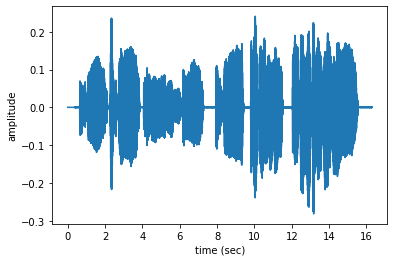

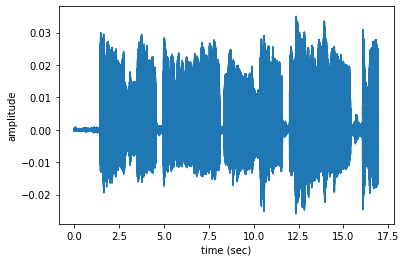

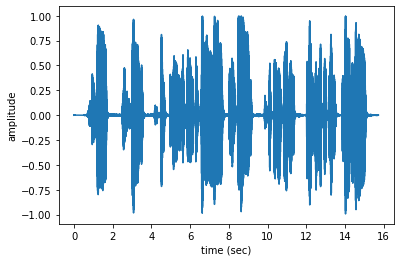

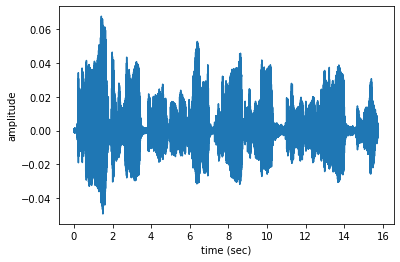

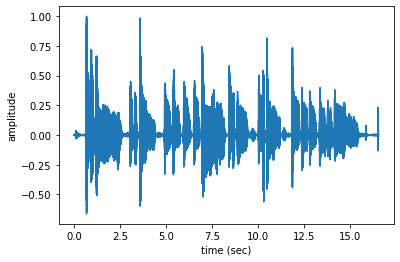

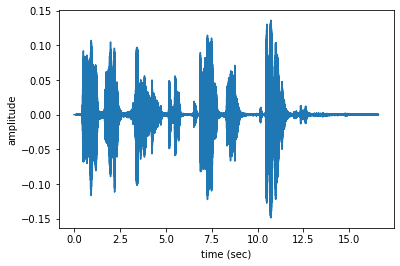

In [4]:
frozen=[10, 13, 14, 17, 19,89]
for n in frozen:
  fs = None # Sampling frequency. If None, fs would be 22050
  x, fs = librosa.load(files_candidates[n],sr=fs)
  t = np.arange(len(x))/fs
  plt.plot(t,x)
  plt.xlabel('time (sec)')
  plt.ylabel('amplitude')
  plt.show()
  display(ipd.Audio(files_candidates[n]))

For the feature extraction stage, I have used the same function as used in the lab as it was an efficient method to extract the audio features. 

The following are the audio features in which will be used as predictors in the machine learning models chosen. The features extracted are:

1. Power.
2. Pitch mean.
3. Pitch standard deviation.
4. Fraction of voiced region.
5. The RMS mean
6. The zero-crossing rate

I have selected these range of features according to what they possess. For example, the RMS mean will provide higher value when the audio is higher in amplitude and therefore a higher RMS means that we will perceive a sound as louder. This could be useful for our model since each candidate would have an unique RMS mean. The zero-crossing rate is the number of times the signal changes value, from positive to negative and vice versa, divided by the length of the frame. These features were added by using the librosa libray.

In [5]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [6]:
def getX(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X =[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)
    rms = np.mean(librosa.feature.rms(y=x))
    zero_crossing = np.mean(librosa.feature.zero_crossing_rate(x))

    xi = [power,pitch_mean,pitch_std,voiced_fr, rms, zero_crossing]
    X.append(xi)

  return np.array(X)

The features extracted were saved in a csv file and it is displayed in the below dataframe:

In [7]:
features_candidates = pd.read_csv('features_candidates.csv')

del features_candidates['Unnamed: 0']

features_candidates

,power,pitch_mean,pitch_std,voiced_fr,rms_mean,zero_crossing_mean
0,0.000016,403.786334,27.338941,0.703923,0.002793,0.083651
1,0.000086,224.135370,50.436145,0.830391,0.007819,0.021831
2,0.025672,200.222674,35.974147,0.862685,0.130404,0.033281
3,0.024954,205.031522,32.459485,0.862462,0.126015,0.029539
4,0.020079,262.703700,51.925666,0.852613,0.103108,0.050929
...,...,...,...,...,...,...
91,0.000865,318.338274,41.754742,0.762172,0.020225,0.083210
92,0.044096,208.067582,55.449339,0.779601,0.163318,0.033723
93,0.029708,391.500362,28.445601,0.613358,0.104613,0.071326
94,0.049779,403.427762,34.592155,0.684066,0.150002,0.085086


Here, I will transform the features data frames into an array so that the data is ready to be used on the models.

In [8]:
X = features_candidates.to_numpy()


The labels are the candidates id numbers which are in the 'participant' column in the candidate data frame created above. They are categorical variables and therefore I will use label encoder to transform them into categorical variables. I will also use Numpy to transform them into an array.

In [9]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

y = candidate_df['participant']
y = y.to_numpy()
le.fit(y)
y_ = le.transform(y)
y_

array([1, 1, 2, 2, 3, 3, 4, 4, 0, 0, 3, 3, 5, 1, 5, 1, 0, 0, 2, 2, 1, 1,
       3, 3, 2, 2, 0, 0, 4, 4, 5, 5, 5, 5, 1, 1, 2, 2, 3, 3, 0, 0, 4, 4,
       1, 1, 0, 0, 3, 3, 2, 2, 2, 2, 4, 4, 1, 1, 5, 5, 0, 3, 0, 3, 2, 2,
       5, 5, 1, 1, 0, 0, 1, 1, 5, 5, 3, 3, 2, 2, 0, 0, 3, 3, 4, 4, 4, 4,
       4, 4, 4, 4, 5, 5, 5, 5])

For some of the models, SVC and KNN, normalising the data can greatly impact our performance results. Therefore, in this part I have used standard scaler to normalise the features values.

In [10]:
from sklearn.preprocessing import StandardScaler
# normalising input values using StandardScaler from sklearn.preprocessing library 

X_normalised = StandardScaler().fit_transform(X)

# 8 Results


As mentioned in the previous sections, I have decided to split the data set into 4 parts: 

80% of the data set will be for the training and 20% for the validation, then I will use the 80% training the data set and split it again so that I have 80% training data set and 20% validation data set from the total 80% initially selected.

Below we can see the training, validation and test shapes.

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_normalised,y,test_size=0.2)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((76, 6), (20, 6), (76,), (20,))

In [12]:
X1_train, X_val, y1_train, y_val = train_test_split(X_train,y_train,test_size=0.2)
X1_train.shape, X_val.shape, y1_train.shape, y_val.shape

((60, 6), (16, 6), (60,), (16,))

**SVM Method**

I will be implementing the SVM method using the training and validation data sets.

In [13]:
from sklearn import svm
"""
Here, I will be tuning the SVM model by changing the C parameter
"""
par = [1,2,3]

for c in par:
  model  = svm.SVC(C=c)
  model.fit(X1_train,y1_train)

  yt_p = model.predict(X1_train)
  yv_p = model.predict(X_val)

  print ("C=", c)
  print('Training Accuracy', np.mean(yt_p==y1_train))
  print('Validation  Accuracy', np.mean(yv_p==y_val))
  print('The support vectors are', model.support_vectors_.shape)

C= 1
Training Accuracy 0.9166666666666666
Validation  Accuracy 0.875
The support vectors are (56, 6)
C= 2
Training Accuracy 0.9666666666666667
Validation  Accuracy 0.875
The support vectors are (54, 6)
C= 3
Training Accuracy 0.9666666666666667
Validation  Accuracy 0.9375
The support vectors are (51, 6)


As we can see above by tuning the SVM parameter, C=3 and C=2, gives us similar training and validation accuracies. The training accuracy using the C=1 parameter is almost 0.2 more than the validation accuracy score and so to avoid overfitting I will be using the parameter C=2 as the training and validation accuracies are closer which may imply the model may be less likely to be overfitting. 

In [14]:
model  = svm.SVC(C=2)
model.fit(X1_train,y1_train)

yt_p = model.predict(X1_train)
yv_p = model.predict(X_val)

print ("C=", 2)
print('Training Accuracy', np.mean(yt_p==y1_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

C= 2
Training Accuracy 0.9666666666666667
Validation  Accuracy 0.875
The support vectors are (54, 6)


Here, we can see the confusion matrix scores below.

We can observe that in the training confusion matrix there was one misclassification: S3 and S6.

In the validation confusion matrix we can see that there are two misclassifications. The misclassified pair is S3 and S6.

In [15]:
from sklearn.metrics import confusion_matrix
train_confusion_matrix = confusion_matrix(y_true=y1_train, y_pred=yt_p)

val_confusion_matrix = confusion_matrix(y_true=y_val, y_pred=yv_p)

print('Training confusion matrix:\n {}\n'.format(train_confusion_matrix))
print('Validation confusion matrix:\n {}\n'.format(val_confusion_matrix))


Training confusion matrix:
 [[ 8  0  0  0  0  0]
 [ 0 10  0  0  0  0]
 [ 0  0 12  0  0  1]
 [ 0  0  0  8  0  0]
 [ 0  0  0  0 11  0]
 [ 0  0  1  0  0  9]]

Validation confusion matrix:
 [[4 0 0 0 0 1]
 [0 1 0 0 0 0]
 [0 0 2 0 0 0]
 [0 0 0 4 0 0]
 [0 0 0 0 2 0]
 [0 0 1 0 0 1]]



To check the model's deployment peformance, below I have fitted the test data set to the model. As we can see we get an accuracy of 0.85 which is not a bad score for the model's performance.

In [16]:
ytest_p = model.predict(X_test)

print('The test  Accuracy', np.mean(ytest_p==y_test))
print('The support vectors are', model.support_vectors_.shape)

The test  Accuracy 0.85
The support vectors are (54, 6)


The confusion matrix shows that there is 1 misclassified pair: S6 and S3.

In [17]:
test_confusion_matrix = confusion_matrix(y_true=y_test, y_pred=ytest_p)
test_confusion_matrix_normalised = train_confusion_matrix.astype('float') / train_confusion_matrix.sum(axis=1)[:, np.newaxis]

print('The test confusion matrix:\n {}\n'.format(test_confusion_matrix))

The test confusion matrix:
 [[2 1 0 0 0 0]
 [0 5 0 0 0 0]
 [0 0 0 0 0 1]
 [0 0 0 4 0 0]
 [0 0 0 0 3 0]
 [0 0 1 0 0 3]]



**KNN Method**

I will firstly implement the KNN Method by using the training and validation data sets.

In [18]:
from sklearn import neighbors

k_values = range(1,10)

accuracy_t = dict.fromkeys(k_values)
accuracy_v = dict.fromkeys(k_values)

for k in k_values:

    knn = neighbors.KNeighborsClassifier(n_neighbors=k)
    knn.fit(X1_train, y1_train)

    # Validation accuracy
    y_val_pred = knn.predict(X_val)
    accuracy_v[k] = np.sum(y_val==y_val_pred)/len(y_val)

    # Training accuracy
    y_train_pred = knn.predict(X1_train)
    accuracy_t[k] = np.sum(y1_train==y_train_pred)/len(y1_train)

    print("The training accuracy for k=", k, "is ", accuracy_t[k])
    print("The validation accuracy for k=", k, "is ", accuracy_v[k])
    print(" ")


The training accuracy for k= 1 is  1.0
The validation accuracy for k= 1 is  0.875
 
The training accuracy for k= 2 is  0.9166666666666666
The validation accuracy for k= 2 is  0.9375
 
The training accuracy for k= 3 is  0.9333333333333333
The validation accuracy for k= 3 is  0.9375
 
The training accuracy for k= 4 is  0.9
The validation accuracy for k= 4 is  0.9375
 
The training accuracy for k= 5 is  0.9166666666666666
The validation accuracy for k= 5 is  0.875
 
The training accuracy for k= 6 is  0.85
The validation accuracy for k= 6 is  0.875
 
The training accuracy for k= 7 is  0.8833333333333333
The validation accuracy for k= 7 is  0.8125
 
The training accuracy for k= 8 is  0.8333333333333334
The validation accuracy for k= 8 is  0.8125
 
The training accuracy for k= 9 is  0.85
The validation accuracy for k= 9 is  0.875
 


As we can see the above, when K = 3 or 2 is when the training and validation accuracies are the closest. Therefore, to avoid underfitting/overfitting I will use K=3 to test the deployment performance of the model.

In [19]:
knn = neighbors.KNeighborsClassifier(n_neighbors=3)
knn.fit(X1_train, y1_train)

# Test accuracy
y_test_pred = knn.predict(X_test)
accuracy_t = np.sum(y_test==y_test_pred)/len(y_test)

print("The test accuracy for k =", 3, "is ", accuracy_t)


The test accuracy for k = 3 is  0.8


As we can see the test accuracy for the model is 0.8 which is also not a bad score to measure the model's deployment peformance score.

**Random Forest Method**

In this part, I will implement the random forest model using the same training, validation and test data sets as described previously.

I will also compare the results having done feature selection and not done feature selection.

I will be using the sklearn library for the feature selection and also to implement the model.

In [20]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
sel = SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=1, n_jobs=-1))
sel.fit(X1_train, y1_train)

SelectFromModel(estimator=RandomForestClassifier(n_jobs=-1, random_state=1))

The select from model support function will find the features in which have the most "weights" and therefore make them the relevant features. As we can see, it has ruled out three features.

In [21]:
selected_features = sel.get_support()
selected_features

array([ True, False,  True, False,  True, False])

The function selected the power, pitch standard deviation and the RMS mean as relevant features.

In [22]:
selected_feat= features_candidates.columns[(sel.get_support())]
selected_feat

Index(['power', 'pitch_std', 'rms_mean'], dtype='object')

So now I will use the transform function to use the selected features to train and validate the model.

In [23]:
X_selected_train = sel.transform(X1_train)
X_selected_val = sel.transform(X_val)

Now I will fit the Random Forest classifier on the selected features from the training model.

In [24]:
rfc_selected = RandomForestClassifier(n_estimators=100, random_state=1, n_jobs=-1)
rfc_selected.fit(X_selected_train, y1_train)

RandomForestClassifier(n_jobs=-1, random_state=1)

And fitting the Random Forest Classifier on all features from the training model.

In [25]:
rfc = RandomForestClassifier(n_estimators=100, random_state=1, n_jobs=-1)
rfc.fit(X1_train, y1_train)

RandomForestClassifier(n_jobs=-1, random_state=1)

Fitting the training data set to the model, the accuracy for the training and validation has a difference of 0.125. This may imply that the model may be likely to be overfitting. I have attempted a few different parameters but the results do not change as much. 

In [26]:
from sklearn.metrics import accuracy_score

ytrain_pred = rfc.predict(X1_train)
yval_pred = rfc.predict(X_val)

# Accuracy using all features

print("Accuracy for the training data set with all 6 features is:", accuracy_score(y1_train, ytrain_pred))

print("Accuracy for validation data set with all 6 features is:", accuracy_score(y_val, yval_pred))

Accuracy for the training data set with all 6 features is: 1.0
Accuracy for validation data set with all 6 features is: 0.875


Here, I fitted the selected features training data sets and used it to find the accuracies values for the training and validation. We can see that the validation accuracy is smaller than the validation accuracy when using all features. We can also see that there is a big difference between the training and validation accuracies which may imply the model's overfitting.

In [27]:
y_selected_train_pred = rfc_selected.predict(X_selected_train)
y_selected_val_pred = rfc_selected.predict(X_selected_val)


# Accuracy using the 3 features

print("Accuracy for the training data set with 3 features is:", accuracy_score(y1_train, y_selected_train_pred))

print("Accuracy for validation data set with 3 features is:", accuracy_score(y_val, y_selected_val_pred))


Accuracy for the training data set with 3 features is: 1.0
Accuracy for validation data set with 3 features is: 0.6875


The random forest classifier shows a test accuracy of 0.75 as shown below. I used the random classifier in which used all features to train the model.

In [28]:
y_test_pred_rfc = rfc.predict(X_test)

print("Accuracy for the test data set with all 6 features is:", accuracy_score(y_test, y_test_pred_rfc))

Accuracy for the test data set with all 6 features is: 0.75


# 9 Conclusions



By implementing the three models SVM, KNN and Random Forest classifier I have decided to rate the SVM as the best model since it was the one that showed better peformance metrics. The SVM method had a 0.85 accuracy value for the test data set which shows that it could have a good deployment. The random forest and KNN showed a accuracy value of 0.75 on the test dataset and therefore had lower performance.

We can see that there were times where some of the models were overfitting. For example, the Random Forest Classifier showed much higher accuracy values than the validation accuracy. I have tried to improve this by changing some of the parameters however there was no much change. As a lesson, I think I may have to look into the amount of data being used to use this model since the amound of data and many other factors may have contributed to this. 

Furthermore, I think that by exploring the parameters of all models, we are able to find the best results. I believe that if I had explored all parameters that affect the results then the models could have achieved a better score. Also, it would be important to use different methods to select features since every model may take the feature values differently and so some features may be relevant for some models but not others. 

Therefore, for this machine learning problem I have chosen to select the SVM as the selected model since it was the one which showed the highest accuracy metric for the test data sets and training data set.
